# OCR(Optical Character Recognition, 광학 문자 인식)

In [4]:
def detect_text(path):
    """Detects text in the file."""
    from google.cloud import vision
    import io
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('Texts:')

    for text in texts:
       print('\n"{}"'.format(text.description))

    vertices = (['({},{})'.format(vertex.x, vertex.y)
                 for vertex in text.bounding_poly.vertices])

    print('bounds: {}'.format(','.join(vertices)))

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))

In [9]:
!ls -l $GOOGLE_APPLICATION_CREDENTIALS

E0313 03:20:27.108903103      32 fork_posix.cc:70]           Fork support is only compatible with the epoll1 and poll polling strategies


-rw-r--r-- 1 root root 2331 Mar 13 02:59 /aiffel/aiffel/ocr_python/plucky-portal-380501-1ce657ac7f9c.json


In [3]:
ls ~/aiffel/ocr_python

plucky-portal-380501-1ce657ac7f9c.json


In [8]:
ls ~/aiffel/ocr_python

E0313 03:16:38.238402267      32 fork_posix.cc:70]           Fork support is only compatible with the epoll1 and poll polling strategies


plucky-portal-380501-1ce657ac7f9c.json  step.png


In [5]:
# 로컬 환경에서는 다운받은 인증키 경로가 정확하게 지정되어 있어야 합니다. 
# 클라우드 환경에서는 무시해도 좋습니다
!ls -l $GOOGLE_APPLICATION_CREDENTIALS

import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] =  os.getenv('HOME')+'/aiffel/ocr_python/plucky-portal-380501-1ce657ac7f9c.json'

total 31012
-rw-r--r-- 1 root root      800 Mar 11 10:22 1-1.50-0.08.h5
-rw-r--r-- 1 root root      800 Mar 11 11:35 1-2.11-0.04.h5
-rw-r--r-- 1 root root      800 Mar 11 10:16 ckpt.h5
-rw-r--r-- 1 root root 12339995 Mar 13 08:58 OCR.ipynb
-rw-r--r-- 1 root root 19400999 Mar 11 11:43 transformer.ipynb


In [2]:
# 입력 이미지 경로를 지정해 주세요.
# (예시) path = os.getenv('HOME')+'/aiffel/ocr_python/test_image.png'
path = os.getenv('HOME')+'/aiffel/ocr_python/image'

# # 위에서 정의한 OCR API 이용 함수를 호출해 봅시다.
# detect_text(path)

In [3]:
file_list = os.listdir(path)

In [12]:
file_list

['img8.jpg',
 'img6.png',
 'img2.jpg',
 'img5.png',
 'img0.png',
 'img7.jpg',
 'img1.jpg',
 'img3.jpg',
 'img9.jpg',
 'img4.png']

In [4]:
image_list = [path + '/' + image for image in file_list]

In [5]:
image_list.sort()

In [6]:
import matplotlib.pyplot as plt
import cv2

In [35]:
image_list

['/aiffel/aiffel/ocr_python/image/img0.png',
 '/aiffel/aiffel/ocr_python/image/img1.jpg',
 '/aiffel/aiffel/ocr_python/image/img2.jpg',
 '/aiffel/aiffel/ocr_python/image/img3.jpg',
 '/aiffel/aiffel/ocr_python/image/img4.png',
 '/aiffel/aiffel/ocr_python/image/img5.png',
 '/aiffel/aiffel/ocr_python/image/img6.png',
 '/aiffel/aiffel/ocr_python/image/img7.jpg',
 '/aiffel/aiffel/ocr_python/image/img8.jpg',
 '/aiffel/aiffel/ocr_python/image/img9.jpg']

만화, 책, 마트 ~~7500~~원 손글씨 간판, 인터넷 텍스트, 화질구린 편의점 빵, ...등등  
일본어, 한국어, 영어 인식할까 궁금해서 시도 해봤따유..  
사진 챙겨오는데 1시간
api 설정하는데 1시간(카드 등록 무섭...)
subplots 사용하는데 1시간...

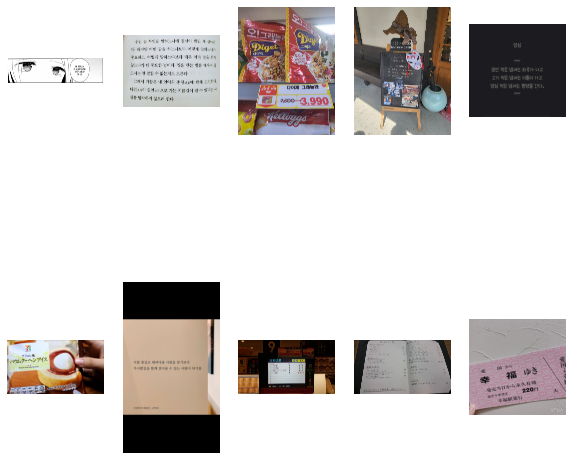

In [51]:
fig, axes = plt.subplots(nrows=2, ncols=5,
                        figsize=(10, 10))
for idx in range(5):
    axes[0][idx].imshow(cv2.cvtColor(cv2.imread(image_list[idx]), cv2.COLOR_BGR2RGB))
    axes[0][idx].axis("off")
    axes[1][idx].imshow(cv2.cvtColor(cv2.imread(image_list[idx+5]), cv2.COLOR_BGR2RGB))
    axes[1][idx].axis("off")
    
plt.show()

In [53]:
image_list

['/aiffel/aiffel/ocr_python/image/img0.png',
 '/aiffel/aiffel/ocr_python/image/img1.jpg',
 '/aiffel/aiffel/ocr_python/image/img2.jpg',
 '/aiffel/aiffel/ocr_python/image/img3.jpg',
 '/aiffel/aiffel/ocr_python/image/img4.png',
 '/aiffel/aiffel/ocr_python/image/img5.png',
 '/aiffel/aiffel/ocr_python/image/img6.png',
 '/aiffel/aiffel/ocr_python/image/img7.jpg',
 '/aiffel/aiffel/ocr_python/image/img8.jpg',
 '/aiffel/aiffel/ocr_python/image/img9.jpg']

In [52]:
file_list

['img8.jpg',
 'img6.png',
 'img2.jpg',
 'img5.png',
 'img0.png',
 'img7.jpg',
 'img1.jpg',
 'img3.jpg',
 'img9.jpg',
 'img4.png']

In [56]:
for image in image_list:
    detect_text(image)
    print("-" * 33)

Texts:

"HE REALLY
IS ALWAYS ONE
STEP AHEAD
OF US."

"HE"

"REALLY"

"IS"

"ALWAYS"

"ONE"

"STEP"

"AHEAD"

"OF"

"US"

"."
bounds: (1589,331),(1598,331),(1598,364),(1589,364)
---------------------------------
Texts:

"우린 늘 무엇을 말하느냐에 정신이 팔린 채 살아간
다. 하지만 어떤 말을 하느냐보다 어떻게 말하느냐가
중요하고, 어떻게 말하느냐보다 때론 어떤 말을 하지
않느냐가 더 중요한 법이다. 입을 닫는 법을 배우지 않
고서는 잘 말할 수 없는지도 모른다.
그래서 가끔은 내 언어의 총량에 관해 고민한다.
다언틈이 실언으로 가는 지름길이 될 수 있다는 사
실을 망각하지 않으려 한다."

"우린"

"늘"

"무엇"

"을"

"말"

"하느냐에"

"정신"

"이"

"팔린"

"채"

"살아간"

"다"

"."

"하지만"

"어떤"

"말"

"을"

"하느냐"

"보다"

"어떻게"

"말"

"하느냐"

"가"

"중요"

"하고"

","

"어떻게"

"말"

"하느냐"

"보다"

"때론"

"어떤"

"말"

"을"

"하지"

"않느냐"

"가"

"더"

"중요한"

"법"

"이다"

"."

"입을"

"닫는"

"법"

"을"

"배우지"

"않"

"고서"

"는"

"잘"

"말할"

"수"

"없는"

"지도"

"모른다"

"."

"그래서"

"가끔은"

"내"

"언어"

"의"

"총량"

"에"

"관해"

"고민"

"한다"

"."

"다언"

"틈"

"이"

"실언"

"으로"

"가는"

"지름길"

"이"

"될"

"수"

"있다는"

"사"

"실"

"을"

"망각"

"하지"

"않으려"

"한다"

"."
bounds: (1348,1679),(1365,1680),(1360,1795),(1343,1794)
-------------

# 8-3. 어떤 과정으로 읽을까요?
구글 API에서는 문자의 영역을 사각형으로 표현하고  
우측에 Block과 Paragraph로 구분해서 인식 결과를 나타내고 있었습니다.  
구글 API가 이미지에 박스를 친 다음 박스별 텍스트의 내용을 알려준 것처럼,  
문자 모델은 보통 두 단계로 이뤄집니다.

먼저 입력받은 사진 속에서 문자의 위치를 찾아냅니다.  
이 과정을 Text Detection 이라고 합니다.  
찾은 문자 영역으로부터 문자를 읽어내는 것은 Text Recognition 입니다.  
예를 들어 아래 카카오의 OCR 모델은 먼저 문자가 있는 영역의 정보  
(coord, Text Recognition)를 찾아내고, 각 영역에서 문자를 인식하고 있습니다.  
이렇게 문자 인식 모델은 Text Detection과 Recognition 두 과정을 통해서 사진 속의 문자를 읽을 수 있게 됩니다.  
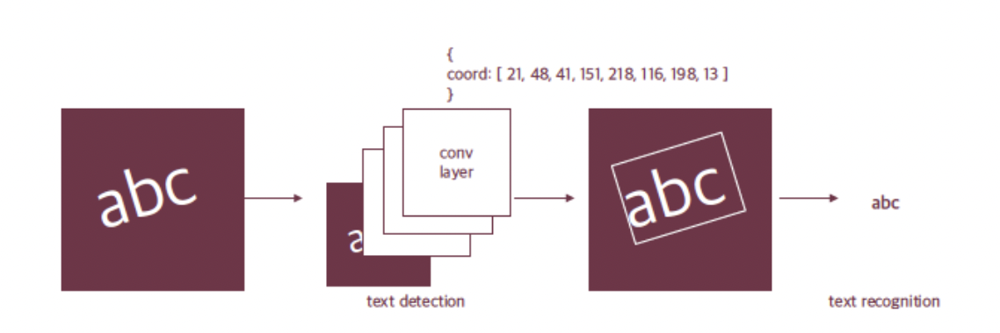
위 그림에서는 문자의 영역을 표현하는 방법으로 사각형의 네 꼭짓점 좌표를 알려 주는 방법을 제시하고 있습니다.  
하지만 다른 도형이나 표현 방법을 사용할 수도 있을 것입니다.  
이런 방법을 연구한 많은 논문들이 있습니다만, 아래에 그중 하나를 소개합니다.  
file:///Users/.m/Downloads/electronics-09-00117.pdf

Q2. 위에 소개한 논문에서 언급된 문자의 영역을 표현하는 방법에는 어떤 것이 있나요?  
2페이지에 소개된 것들의 개념을 간단히 정리해 봅시다.  
> 축에 정렬된 사각형인 Bounding box  
> 그리고 돌아간 사각형 Oriented bounding box,  
> 자유로운 사각형은 Quadrangle  
> 그리고 다각형인 Polygon, Pixel 수준으로 영역을 표현한 Mask 등이 있습니다.

# 8-4. 딥러닝 문자인식의 시작
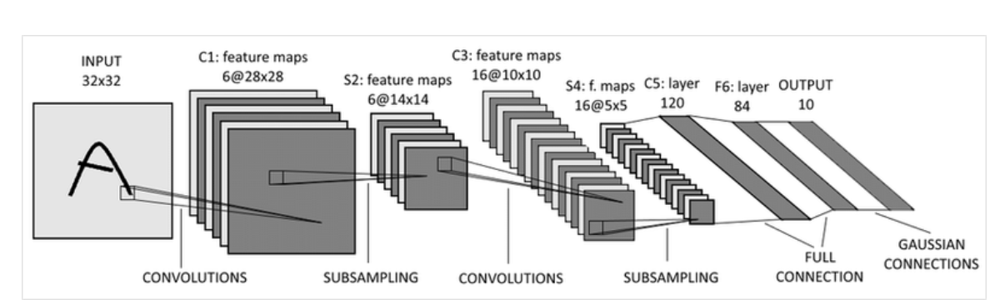
다들 딥러닝을 배우는 동안 MNIST 데이터셋을 여러 번 접하셨을 것입니다. 주로 0부터 9까지의 손으로 쓰인 숫자가 있는 이미지를 이미지 분류 문제로 딥러닝을 이용하여 풀어보는 데이터셋으로 사용하지요!  

MNIST가 딥러닝 데이터셋의 "hello, world!"라면, LeNet은 CNN의 "hello, world!"라 할 수 있습니다. 1998년에 발표된 LeNet은 우편번호나 손글씨를 읽기 위해서 만들어졌습니다.  
앞서 학습한 MNIST로 LeNet을 훈련시킨다면 우편번호를 읽을 수 있는 것이지요. 위 그림은 LeNet-5의 구조입니다. 요즘 나온 모델들을 생각한다면 구조가 상당히 간단하지요?   Convolution 레이어와 최종 출력 레이어로 이뤄져 있습니다.  

아래 이미지는 입력과 각 Layer의 활성화를 시각화한 LeNet의 MNIST 데모 이미지입니다.  
우측 상단에서 인식 결과를 확인할 수 있습니다.  
https://vitalab.github.io/article/2017/03/29/lenet.html

Q3. LeNet 데모페이지에서 Noise Resistance의 예시를 보면 문자가 노이즈,  
즉 잡음에 가려져도 문자를 잘 읽습니다.  
이런 강건한(robust) 모델은 어떻게 만들 수 있을까요?  
모델 강건성이란 무엇인지 찾아보고 방법을 고민해 봅시다.  

> 가려진 케이스에 대한 데이터를 확보하거나  
> Augmentation을 통해서 해당 케이스에 대한 강건성을 확보합니다.

# 8-5. 사진 속 문자 찾아내기 - detection
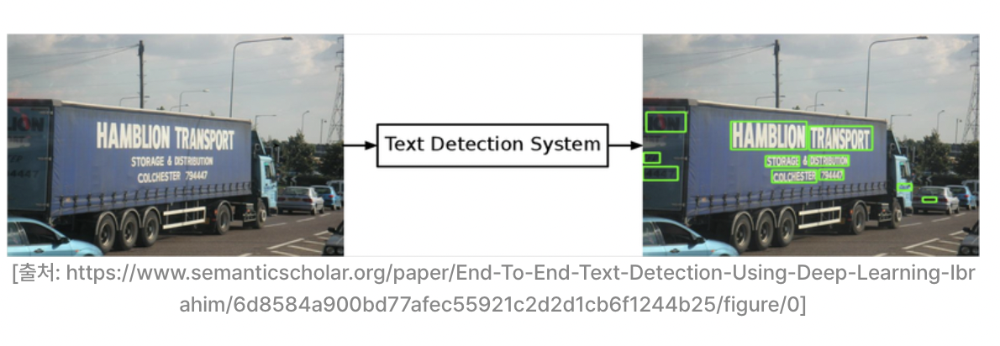
https://blogs.sas.com/content/saskorea/2018/12/21/%EB%94%A5%EB%9F%AC%EB%8B%9D%EC%9D%84-%ED%99%9C%EC%9A%A9%ED%95%9C-%EA%B0%9D%EC%B2%B4-%ED%83%90%EC%A7%80-%EC%95%8C%EA%B3%A0%EB%A6%AC%EC%A6%98-%EC%9D%B4%ED%95%B4%ED%95%98%EA%B8%B0/

사진 속 문자를 찾아내는 최근의 딥러닝 모델은 일반적인 Object Detection(객체 인식) 방법으로 접근합니다.  
이미지 속에서 물체를 찾아내는 딥러닝 모델에게 문자를 찾도록 학습을 시킨 것이죠. 물론 문자의 특성에 따라서 모델을 변경해 주기도 합니다.  

딥러닝 기반 객체 검출 방법에는 Regression(회귀) 방식이나 Segmentation(세그멘테이션) 방식이 있습니다.  
Regression은 기준으로 하는 박스 대비 문자의 박스가 얼마나 차이가 나는지를 학습합니다.   
Segmentation은 픽셀 단위로 해당 픽셀이 문자를 표현하는지를 분류하는 문제(pixel-wise classification)라고 볼 수 있습니다.  
객체 검출과 세그멘테이션에 대한 자세한 방법은 다른 강의에서 배우도록 합시다.  
여기서는 문자를 찾아내는 딥러닝 모델이 우리가 흔히 들어본 Object Detection과 큰 차이가 없다는 것만 알아두셔도 됩니다.

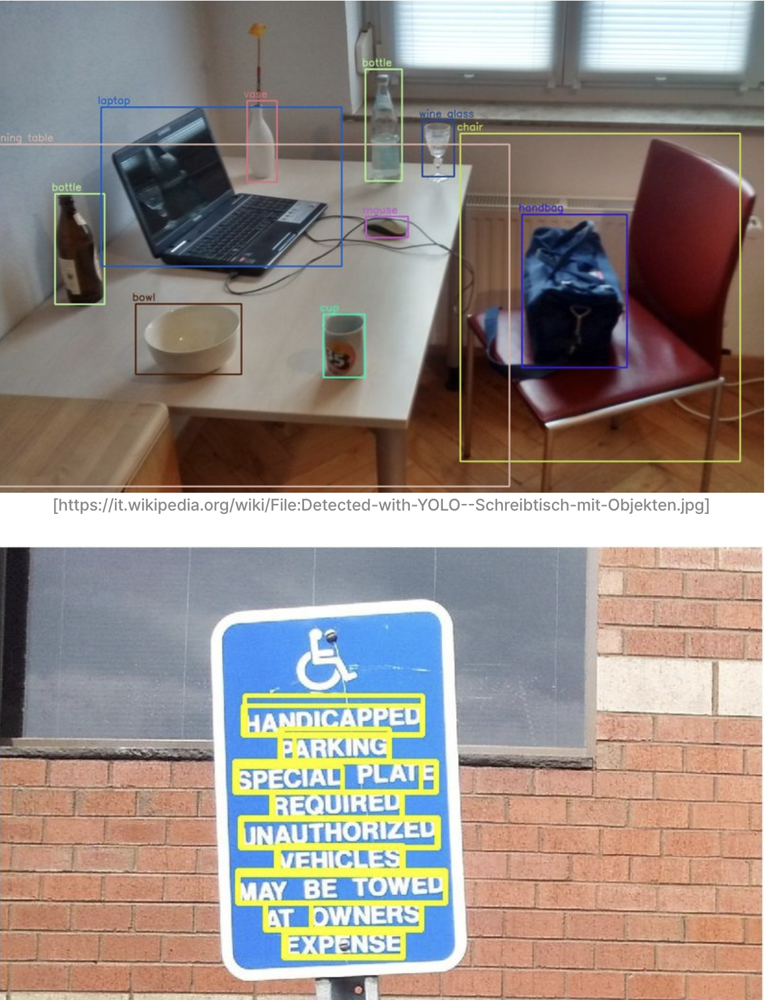 
Q4. 문자는 일반적인 객체와 어떤 특성이 다를까요? 아래 두 가지 사진을 두고 차이점을 찾아봅시다!  
> 일반적인 객체는 물체에 따라서 크기가 일정한 특징을 가집니다.  
> 하지만 문자는 영역과 배치가 자유로워 문자를 검출하기 위한 설정이 필요합니다.  
> 또한 객체는 물체 간 거리가 충분히 확보되는 데에 반해 글자는 매우 촘촘하게 배치되어 있습니다.

---
Q5. 우리가 사진 속 문자를 검출할 때 어떤 단위로 문자를 검출해낼 수 있을까요? 그 단위를 생각해 봅시다.  
> 문자, 단어, 줄, 단락 단위 등으로 검출해낼 수 있습니다.


# 8-6. 사진 속 문자 읽어내기 - recognition
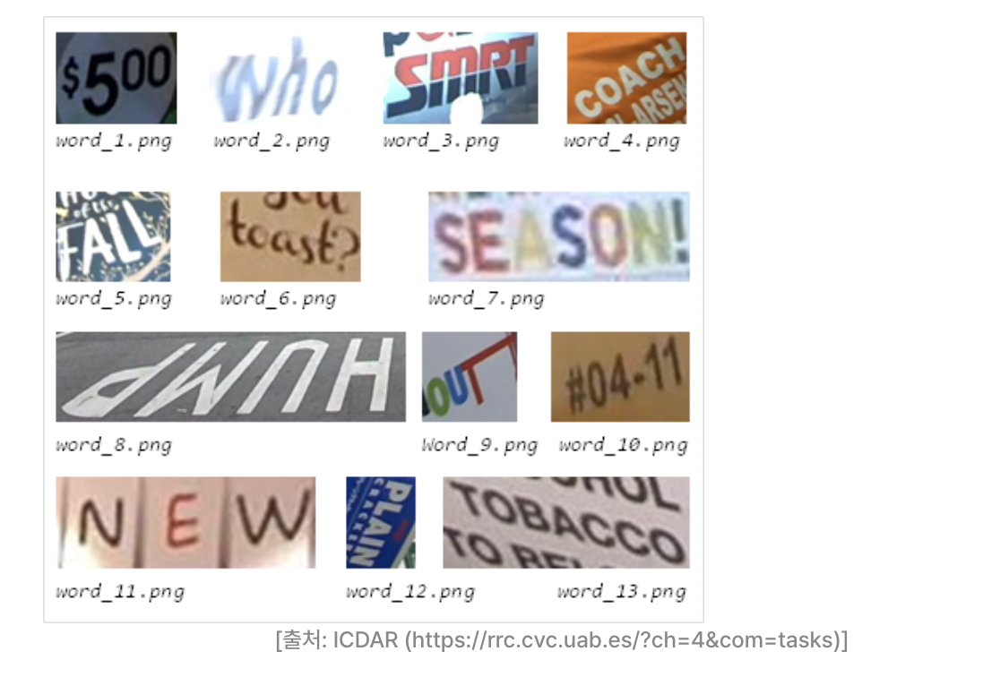
문자 인식은 사진 속에서 문자를 검출해 내는 검출 모델이 영역을 잘라서 주면 그 영역에 어떤 글자가 포함되어 있는지 읽어내는 과정입니다.  
아래는 ICDAR15라는 OCR 데이터셋에서 단어 단위로 잘린 이미지입니다.  
문자 인식 모델은 이렇게 작게 잘린 이미지가 들어오면 이미지 속에 어떤 단어가 포함됐는지 찾아내지요.  

사실 이 과정은 이미지 문제보다는 자연어 처리에서 많은 영감을 받았습니다.  
자연어 처리를 한다면 RNN이 떠오르실 텐데요.  
이미지 내의 문자 인식 모델의 기본적인 방법 중 하나가 바로 CNN과 RNN을 결합한 CRNN 모델입니다.  
이미지 내의 텍스트와 연관된 특징을 CNN을 통해 추출한 후에 스텝 단위의 문자 정보를 RNN으로 인식하는 것이지요.



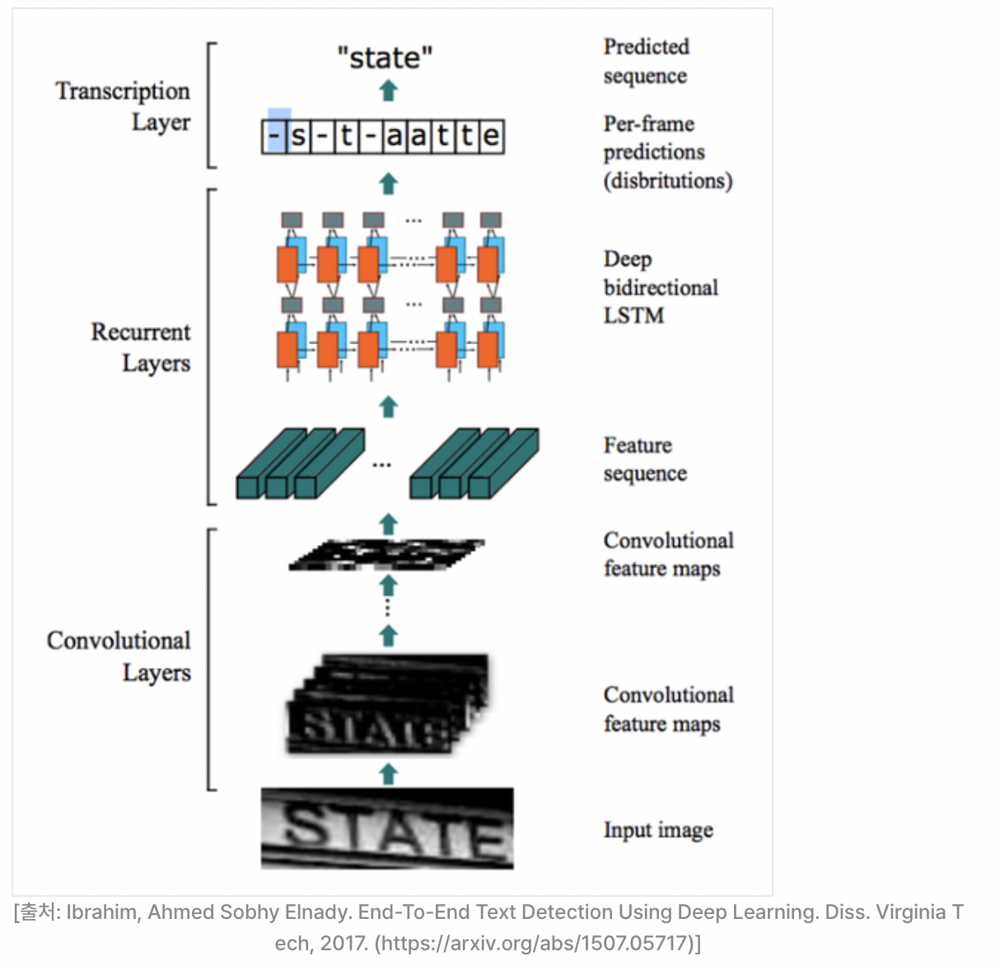
이렇게 검출 결과로부터 인식 모델을 통해 문자를 인식하고 나면 구글 API의 결과처럼 사진 속 영역에 표시를 하고 그 영역에 어떤 문자가 적혀있는지 알 수 있는 OCR 시스템이 됩니다.

---
Q6. Detection, Recognition 모델만으로는 단어별 문자를 인식할 수는 있어도  
사람이 의미를 가지고 읽어내는 문단("Paragraph") 또는 블록("Block") 정보를 알 수 없을 것 같은데 구글은 이를 어떻게 풀고 있을까요?  
자신만의 방법을 상상해 봅시다. 딥러닝을 적용해도 되고 간단한 Rule을 적용한 로직이어도 됩니다.
> 이미지 내에서 검출된 단어 영역의 위치정보를 기준으로 분리해낼 수 있을 것 같습니다.  
> X,Y 축으로 L2 Distance가 일정 이내인 단어 또는 문자들의 그룹을 만들어 단락으로 만들어낼 수 있습니다.

# 8-7. keras-ocr 써보기
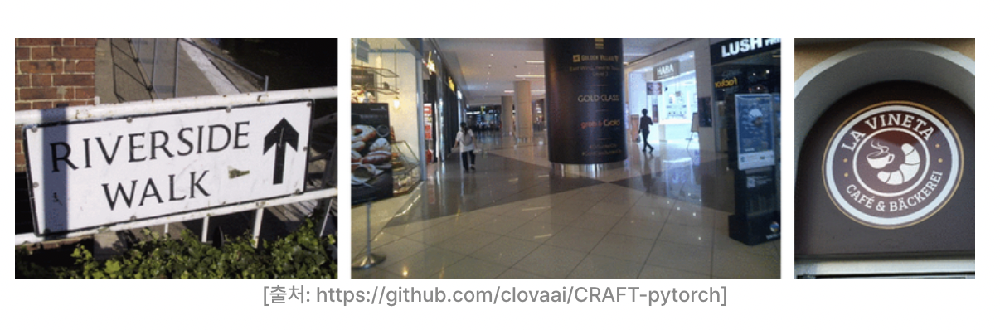

위에서 구글 API를 쓰듯이 OCR을 데모로 써볼 수 있지만 직접 OCR 모델을 만들어 돌려보고 싶을 때는 어떻게 해야 할까요?  
저희는 텐서플로우 기반의 모델을 주로 다뤄왔으니 텐서플로우를 기반으로 모델을 구현해서 OCR을 직접 돌려보도록 하겠습니다.  

keras-ocr은 텐서플로우의 케라스 API를 기반으로 이미지 속 문자를 읽는 End-to-End OCR을 할 수 있게 해줍니다. 공식 문서에도 나와 있듯,  
검출 모델로는 네이버 데뷰 2018 영상에서 소개한 CRAFT(Character Region Awareness for Text Detection)를 사용하고, 인식 모델로는 앞에서 설명한 CRNN을 사용합니다.

In [57]:
!pip list | grep keras-ocr

keras-ocr                     0.8.8


In [7]:
import keras_ocr

# keras-ocr이 detector과 recognizer를 위한 모델을 자동으로 다운로드받게 됩니다. 
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


In [60]:
dir(keras_ocr.pipeline)

['Pipeline',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 'detection',
 'np',
 'recognition',
 'tools']

In [6]:
# 이미지 소스의 url을 사용할 건데요. 이미지는 https://unsplash.com/s/photos/text 에서 가져왔습니다.
# 테스트에 사용할 이미지 url을 모아 봅니다. 추가로 더 모아볼 수도 있습니다. 
image_urls = [
  'https://source.unsplash.com/M7mu6jXlcns/640x460',
  'https://source.unsplash.com/6jsp4iHc8hI/640x460',
  'https://source.unsplash.com/98uYQ-KupiE',
  'https://source.unsplash.com/j9JoYpaJH3A',
  'https://source.unsplash.com/eBkEJ9cH5b4'
]

images = [ keras_ocr.tools.read(url) for url in image_urls]
prediction_groups = [pipeline.recognize([url]) for url in image_urls]

이제 인식된 결과를 pyplot으로 시각화를 해봅니다.

사용이 매우 간단합니다!  
내부적으로 recognize() 는 검출기와 인식기를 두고,  
검출기로 바운딩 박스(bounding box, 문자가 있는 영역을 표시한 정보)를 검출한 뒤,  
인식기가 각 박스로부터 문자를 인식하는 과정을 거치도록 합니다.  

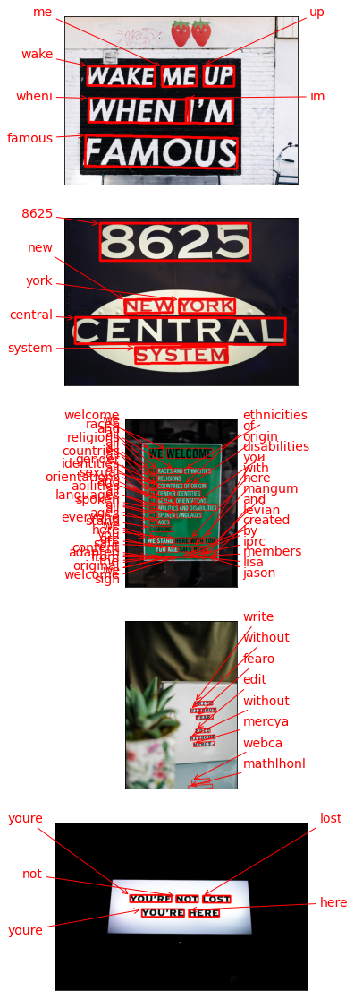

In [7]:
# Plot the predictions
fig, axs = plt.subplots(nrows=len(images), figsize=(20, 20))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=images[idx], 
                                    predictions=prediction_groups[idx][0], ax=ax)

(주의사항)
keras-ocr은 한글 데이터셋으로 훈련이 되어있지 않은 모델입니다.  
한글 텍스트의 detection은 정상적으로 진행되더라도  
recognition 결과가 엉뚱하게 나올 수 있음에 주의해 주세요.

---

In [8]:
image_list

['/aiffel/aiffel/ocr_python/image/.ipynb_checkpoints',
 '/aiffel/aiffel/ocr_python/image/img0.png',
 '/aiffel/aiffel/ocr_python/image/img1.jpg',
 '/aiffel/aiffel/ocr_python/image/img2.jpg',
 '/aiffel/aiffel/ocr_python/image/img3.jpg',
 '/aiffel/aiffel/ocr_python/image/img4.png',
 '/aiffel/aiffel/ocr_python/image/img5.png',
 '/aiffel/aiffel/ocr_python/image/img6.png',
 '/aiffel/aiffel/ocr_python/image/img7.jpg',
 '/aiffel/aiffel/ocr_python/image/img8.jpg',
 '/aiffel/aiffel/ocr_python/image/img9.jpg',
 '/aiffel/aiffel/ocr_python/image/tesseract_ocr',
 '/aiffel/aiffel/ocr_python/image/test2']

In [9]:
img_list = ['/aiffel/aiffel/ocr_python/image/img0.png',
             '/aiffel/aiffel/ocr_python/image/img1.jpg',
             '/aiffel/aiffel/ocr_python/image/img2.jpg',
             '/aiffel/aiffel/ocr_python/image/img3.jpg',
             '/aiffel/aiffel/ocr_python/image/img4.png',
             '/aiffel/aiffel/ocr_python/image/img5.png']

In [10]:
images2 = [ keras_ocr.tools.read(img) for img in img_list]
prediction_groups2 = [pipeline.recognize([img]) for img in img_list]

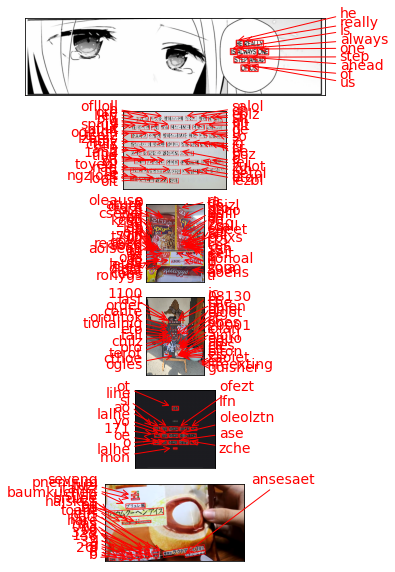

In [11]:
# Plot the predictions
fig, axs = plt.subplots(nrows=len(images2), figsize=(10, 10))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=images2[idx], 
                                    predictions=prediction_groups2[idx][0], ax=ax)

그림 사진 많아서 그런지 커널 주금... 하...

---

### 3) 테서랙트로 문자 검출하고 이미지 자르기 (detection)
테서랙트를 사용하면 한 번에 이미지 내의 문자 검출과 인식을 할 수 있는데요.  
우리는 OCR이 이뤄지는 전체 과정을 직접 거쳐보기 위해 검출을 먼저 해 봅시다.

In [18]:
import os
import pytesseract
from PIL import Image
from pytesseract import Output
import matplotlib.pyplot as plt

# OCR Engine modes(–oem):
# 0 - Legacy engine only.
# 1 - Neural nets LSTM engine only.
# 2 - Legacy + LSTM engines.
# 3 - Default, based on what is available.

# Page segmentation modes(–psm):
# 0 - Orientation and script detection (OSD) only.
# 1 - Automatic page segmentation with OSD.
# 2 - Automatic page segmentation, but no OSD, or OCR.
# 3 - Fully automatic page segmentation, but no OSD. (Default)
# 4 - Assume a single column of text of variable sizes.
# 5 - Assume a single uniform block of vertically aligned text.
# 6 - Assume a single uniform block of text.
# 7 - Treat the image as a single text line.
# 8 - Treat the image as a single word.
# 9 - Treat the image as a single word in a circle.
# 10 - Treat the image as a single character.
# 11 - Sparse text. Find as much text as possible in no particular order.
# 12 - Sparse text with OSD.
# 13 - Raw line. Treat the image as a single text line, bypassing hacks that are Tesseract-specific.

def crop_word_regions(image_path='./images/sample.png', output_path='./output'):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)

    recognized_data = pytesseract.image_to_data(
        image, lang='kor',    # 한국어라면 lang='kor'
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
            print(output_img_path)
            cropped_image = image.crop((
                left,
                top,
                left+width,
                top+height
            ))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1
    return cropped_image_path_list

(주의) 위 코드에서 lang='kor' 로 바꾸면 에러가 발생합니다. 테서랙트의 언어팩을 설치해야 정상 동작하게 됩니다.

$ sudo apt install tesseract-ocr-kor

In [8]:
# !sudo apt install tesseract-ocr-kor

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr-kor is already the newest version (1:4.00~git30-7274cfa-1).
The following packages were automatically installed and are no longer required:
  accountsservice-ubuntu-schemas bc bluez-obexd cups cups-browsed cups-client
  cups-common cups-core-drivers cups-daemon cups-filters
  cups-filters-core-drivers cups-ipp-utils cups-ppdc cups-server-common
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript
  gir1.2-dbusmenu-glib-0.4 gnome-bluetooth gnome-power-manager
  gnome-screensaver gsettings-ubuntu-schemas gvfs-backends indicator-applet
  indicator-application indicator-appmenu indicator-bluetooth indicator-common
  indicator-datetime indicator-keyboard indicator-messages indicator-power
  indicator-printers indicator-session indicator-sound jayatana
  libaccounts-glib0 libbamf3-2 libcdio-cdda2 libcdio-paranoia2 libcdio18
  libcupsfilters1 libfcitx-config4 libfcitx-g

In [16]:
image_list.sort()

위에서 구현한 crop_word_regions() 함수는 여러분이 선택한 테스트 이미지를 받아서,  
문자 검출을 진행한 후, 검출된 문자 영역을 crop한 이미지로 만들어 그 파일들의 list를 리턴하는 함수입니다.  

기본적으로 pytesseract.image_to_data() 를 사용합니다.  
파이썬에서 편하게 사용하기 위해서 pytesseract 의 Output 을 사용해서 결괏값의 형식을 딕셔너리(DICT) 형식으로 설정해 주게 됩니다.  
이렇게 인식된 결과는 바운딩 박스의 left, top, width, height 정보를 가지게 됩니다.  
바운딩 박스를 사용해 이미지의 문자 영역들을 파이썬 PIL(pillow) 또는 opencv 라이브러리를 사용해 잘라(crop)서 cropped_image_path_list에 담아 리턴하였습니다.  

`crop_word_regions`  
(image_path='./images/sample.png', output_path='./output')

In [19]:
type(cropped_image_path_list)

list

In [17]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python'
img_file_path = work_dir + '/image/img6.png'   #테스트용 이미지 경로입니다. 본인이 선택한 파일명으로 바꿔주세요. 

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)

/aiffel/aiffel/ocr_python/0000.png
/aiffel/aiffel/ocr_python/0001.png
/aiffel/aiffel/ocr_python/0002.png
/aiffel/aiffel/ocr_python/0003.png
/aiffel/aiffel/ocr_python/0004.png
/aiffel/aiffel/ocr_python/0005.png
/aiffel/aiffel/ocr_python/0006.png
/aiffel/aiffel/ocr_python/0007.png
/aiffel/aiffel/ocr_python/0008.png
/aiffel/aiffel/ocr_python/0009.png
/aiffel/aiffel/ocr_python/0010.png
/aiffel/aiffel/ocr_python/0011.png
/aiffel/aiffel/ocr_python/0012.png
/aiffel/aiffel/ocr_python/0013.png
/aiffel/aiffel/ocr_python/0014.png
/aiffel/aiffel/ocr_python/0015.png
/aiffel/aiffel/ocr_python/0016.png
/aiffel/aiffel/ocr_python/0017.png
/aiffel/aiffel/ocr_python/0018.png
/aiffel/aiffel/ocr_python/0019.png
/aiffel/aiffel/ocr_python/0020.png
/aiffel/aiffel/ocr_python/0021.png
/aiffel/aiffel/ocr_python/0022.png


In [18]:
def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang='kor',    # 한국어라면 lang='kor'
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data['text'])
    print("Done")

# 위에서 준비한 문자 영역 파일들을 인식하여 얻어진 텍스트를 출력합니다.
recognize_images(cropped_image_path_list)

8

너들

4

그

제 간그 나테~

데려다줄

사람을

찾기보다

가시

받김을

암께

걸어술

수

사1

하게

해줘서,

끄마위

()1 ㄴㄴ

1

ㅅ^

사람이

되기들

벼

Done


In [27]:
image_list[:]
# 1 2 4 6

['/aiffel/aiffel/ocr_python/image/img0.png',
 '/aiffel/aiffel/ocr_python/image/img1.jpg',
 '/aiffel/aiffel/ocr_python/image/img2.jpg',
 '/aiffel/aiffel/ocr_python/image/img3.jpg',
 '/aiffel/aiffel/ocr_python/image/img4.png',
 '/aiffel/aiffel/ocr_python/image/img5.png',
 '/aiffel/aiffel/ocr_python/image/img6.png',
 '/aiffel/aiffel/ocr_python/image/img7.jpg',
 '/aiffel/aiffel/ocr_python/image/img8.jpg',
 '/aiffel/aiffel/ocr_python/image/img9.jpg']

In [23]:
ls ~/aiffel/ocr_python/image/tesseract_ocr

In [28]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/image/tesseract_ocr'

tesseract_list = []

for img in image_list[:2]:
    tesseract_list.append(crop_word_regions(img, work_dir))
# overwrite가 되어버려서 한 곳에다가 output시키면 안되넹....

/aiffel/aiffel/ocr_python/image/tesseract_ocr/0000.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0001.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0002.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0003.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0004.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0005.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0006.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0007.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0008.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0009.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0010.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0011.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0012.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0013.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0014.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0015.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0016.png
/aiffel/aiffel/ocr_python/image/tesseract_ocr/0000.png
/aiffel/ai

tesseract_list
'/aiffel/aiffel/ocr_python/image/tesseract_ocr/0013.png',
  '/aiffel/aiffel/ocr_python/image/tesseract_ocr/0014.png',
  '/aiffel/aiffel/ocr_python/image/tesseract_ocr/0015.png',
  '/aiffel/aiffel/ocr_python/image/tesseract_ocr/0016.png'],
 ['/aiffel/aiffel/ocr_python/image/tesseract_ocr/0000.png',
  '/aiffel/aiffel/ocr_python/image/tesseract_ocr/0001.png',
  '/aiffel/aiffel/ocr_python/image/tesseract_ocr/0002.png',
  '/aiffel/aiffel/ocr_python/image/tesseract_ocr/0003.png',
  '/aiffel/aiffel/ocr_python/image/tesseract_ocr/0004.

In [31]:
def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang='kor',    # 한국어라면 lang='kor'
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data['text'])
    print("Done")

# 위에서 준비한 문자 영역 파일들을 인식하여 얻어진 텍스트를 출력합니다.
recognize_images(tesseract_list[0])

우린

그

무엇을

말하느나에

정신ㅇ|

팔린

채

살아간

다.

하지만

어1

막을

하느나보다

어떻

게

말하느나가

중요하고,

Done


In [33]:
image_list[4]

'/aiffel/aiffel/ocr_python/image/img4.png'

In [34]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/image/test2'

recognize_images(crop_word_regions(image_list[4], work_dir))

/aiffel/aiffel/ocr_python/image/test2/0000.png
/aiffel/aiffel/ocr_python/image/test2/0001.png
/aiffel/aiffel/ocr_python/image/test2/0002.png
/aiffel/aiffel/ocr_python/image/test2/0003.png
/aiffel/aiffel/ocr_python/image/test2/0004.png
/aiffel/aiffel/ocr_python/image/test2/0005.png
/aiffel/aiffel/ocr_python/image/test2/0006.png
/aiffel/aiffel/ocr_python/image/test2/0007.png
/aiffel/aiffel/ocr_python/image/test2/0008.png
/aiffel/aiffel/ocr_python/image/test2/0009.png
/aiffel/aiffel/ocr_python/image/test2/0010.png
/aiffel/aiffel/ocr_python/image/test2/0011.png
/aiffel/aiffel/ocr_python/image/test2/0012.png
어보

20 도

는 히

오기

0000

고

20 나돌

이들이

10 랍

이고르 도

는

쁘

사다,

Done


---
---
---

In [1]:
import os
import pytesseract
from PIL import Image
from pytesseract import Output
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import cv2

path = os.getenv('HOME')+'/aiffel/ocr_python/image'
file_list = os.listdir(path)
image_list = [path + '/' + image for image in file_list]
image_list.sort()
###

######

def detect_text(path):
    """Detects text in the file."""
    from google.cloud import vision
    import io
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('Texts:')

    for text in texts:
       print('\n"{}"'.format(text.description))

    vertices = (['({},{})'.format(vertex.x, vertex.y)
                 for vertex in text.bounding_poly.vertices])

    print('bounds: {}'.format(','.join(vertices)))

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))


###
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] =  os.getenv('HOME')+'/aiffel/ocr_python/plucky-portal-380501-1ce657ac7f9c.json'




###
import keras_ocr

# keras-ocr이 detector과 recognizer를 위한 모델을 자동으로 다운로드받게 됩니다. 
pipeline = keras_ocr.pipeline.Pipeline()

######


def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang='kor',    # 한국어라면 lang='kor'
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data['text'])
    print("Done")
    
    
######

def crop_word_regions(image_path='./images/sample.png', output_path='./output'):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)

    recognized_data = pytesseract.image_to_data(
        image, lang='kor',    # 한국어라면 lang='kor'
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
            print(output_img_path)
            cropped_image = image.crop((
                left,
                top,
                left+width,
                top+height
            ))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1
    return cropped_image_path_list



Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


### Step1. 검증용 데이터셋 준비
OCR 관련해서 오늘 다루어본 주제는 텍스트의 모양과 크기, 배치, 노이즈 등 OCR의 성능에 영향을 미치는 요인들에 관한 것이었습니다. 여러분들은 위 3가지 기능들이 이미지에 나타난 특징에 따라 얼마나 정확하게 문자를 detect하고 recognize하는지를 검증하기 위한 이미지 데이터를 모아야 합니다. 이미지가 많을수록 좋겠지만 검증해야 할 항목별로 고루 갖춰지는 것도 중요합니다.

가능하다면 함께 학습하는 동료들과 힘을 합쳐보는 것을 추천합니다. 그렇다고 너무 많은 이미지 데이터로 검증하는 것은 이후 결과를 정리하는 것이 힘들 수 있으니 테스트용 이미지는 아무리 많아도 20장을 넘기지 않는 것으로 합시다.

---
### Step2. keras-ocr, Tesseract로 테스트 진행(Google OCR API는 선택 사항)
위 두 가지 모듈을 활용하는 방법에 대해서는 코드 레벨로 이미 경험해 보셨을 것입니다. 이미지 리스트를 정리한 후 반복문을 실행하며 모듈이 출력한 결과를 모아 봅시다. 가능하다면 Google OCR API를 포함해 세 가지 모듈을 다 써보세요.

---
### Step3. 테스트 결과 정리
모듈들마다 출력 형태가 다릅니다. 분석을 위해 결과를 일목요연하게 정리해 보는 것이 도움이 될 것입니다. 시각화 방법이 함께 활용된다면 더욱 좋겠군요.

---
### Step4. 결과 분석과 결론 제시
우선 여러분들이 구현하고자 하는 서비스의 목적과 내용을 먼저 정리합니다. 여러분들이 검토한 OCR 모델들이 그 목적에 부합하는지 확인하기 위해 필요한 평가 기준을 제시합니다. 그 기준에 따라 위에서 정리한 테스트 결과를 분석하여 가장 나은 대안의 모델을 선정합니다.

---
---

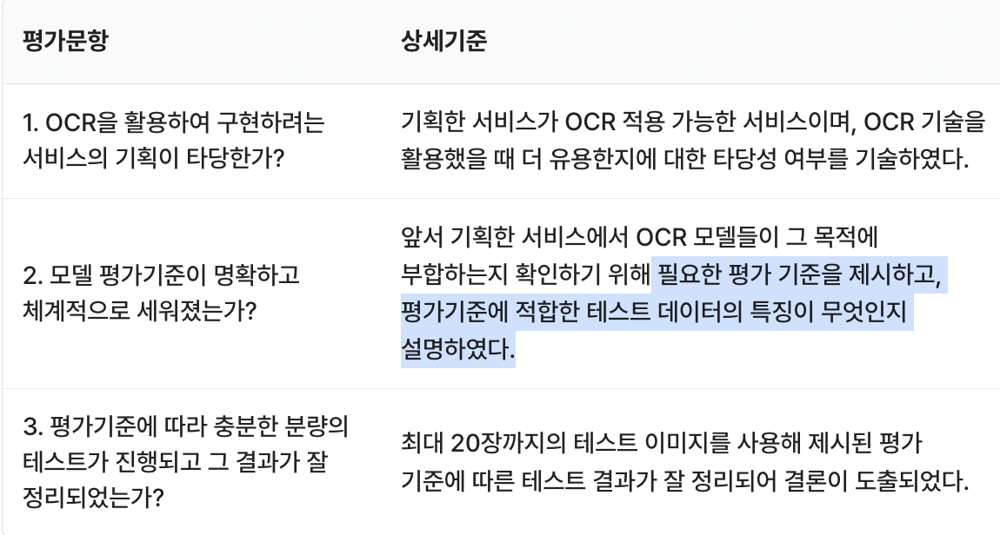

In [2]:
img_list = ['/aiffel/aiffel/ocr_python/image/img0.png',
             '/aiffel/aiffel/ocr_python/image/img1.jpg',
             '/aiffel/aiffel/ocr_python/image/img2.jpg',
             '/aiffel/aiffel/ocr_python/image/img3.jpg',
             '/aiffel/aiffel/ocr_python/image/img4.png',
             '/aiffel/aiffel/ocr_python/image/img5.png',
             '/aiffel/aiffel/ocr_python/image/img6.png',
             '/aiffel/aiffel/ocr_python/image/img7.jpg',
             '/aiffel/aiffel/ocr_python/image/img8.jpg',
             '/aiffel/aiffel/ocr_python/image/img9.jpg']

In [3]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/image/test3'

In [4]:
def ocr(img_path):
    plt.imshow(cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB))
    plt.axis("off");
    print('-' * 33)

    print("Google OCR API")
    detect_text(img_path)
    print('-' * 33)
    
    
    img_ocr = keras_ocr.tools.read(img_path)
    img_pipe = pipeline.recognize([img_path])
    print("keras_ocr")
    keras_ocr.tools.drawAnnotations(image=img_ocr, 
                                        predictions=img_pipe[0])

    print('-' * 33)

    print("Tesseract")
    recognize_images(crop_word_regions(img_path, work_dir))
    print('-' * 33)
    print("원본 이미지")

원본 이미지
---------------------------------
Google OCR API
Texts:

"HE REALLY
IS ALWAYS ONE
STEP AHEAD
OF US."

"HE"

"REALLY"

"IS"

"ALWAYS"

"ONE"

"STEP"

"AHEAD"

"OF"

"US"

"."
bounds: (1589,331),(1598,331),(1598,364),(1589,364)
---------------------------------
keras_ocr
---------------------------------
Tesseract
/aiffel/aiffel/ocr_python/image/test3/0000.png
/aiffel/aiffel/ocr_python/image/test3/0001.png
/aiffel/aiffel/ocr_python/image/test3/0002.png
/aiffel/aiffel/ocr_python/image/test3/0003.png
/aiffel/aiffel/ocr_python/image/test3/0004.png
/aiffel/aiffel/ocr_python/image/test3/0005.png
/aiffel/aiffel/ocr_python/image/test3/0006.png
/aiffel/aiffel/ocr_python/image/test3/0007.png
/aiffel/aiffel/ocr_python/image/test3/0008.png
/aiffel/aiffel/ocr_python/image/test3/0009.png
/aiffel/aiffel/ocr_python/image/test3/0010.png
/aiffel/aiffel/ocr_python/image/test3/0011.png
/aiffel/aiffel/ocr_python/image/test3/0012.png
/aiffel/aiffel/ocr_python/image/test3/0013.png
/aiffel/aiffel/ocr_py

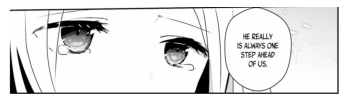

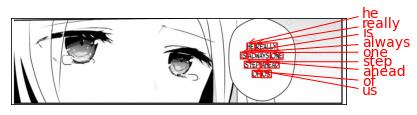

In [33]:
ocr(img_list[0])

---------------------------------
Google OCR API


/opt/conda/lib/python3.9/site-packages/pkg_resources/__init__.py:122: PkgResourcesDeprecationWarning: 0.996-ko-0.9.2 is an invalid version and will not be supported in a future release
  warnings.warn(


Texts:

"우린 늘 무엇을 말하느냐에 정신이 팔린 채 살아간
다. 하지만 어떤 말을 하느냐보다 어떻게 말하느냐가
중요하고, 어떻게 말하느냐보다 때론 어떤 말을 하지
않느냐가 더 중요한 법이다. 입을 닫는 법을 배우지 않
고서는 잘 말할 수 없는지도 모른다.
그래서 가끔은 내 언어의 총량에 관해 고민한다.
다언틈이 실언으로 가는 지름길이 될 수 있다는 사
실을 망각하지 않으려 한다."

"우린"

"늘"

"무엇"

"을"

"말"

"하느냐에"

"정신"

"이"

"팔린"

"채"

"살아간"

"다"

"."

"하지만"

"어떤"

"말"

"을"

"하느냐"

"보다"

"어떻게"

"말"

"하느냐"

"가"

"중요"

"하고"

","

"어떻게"

"말"

"하느냐"

"보다"

"때론"

"어떤"

"말"

"을"

"하지"

"않느냐"

"가"

"더"

"중요한"

"법"

"이다"

"."

"입을"

"닫는"

"법"

"을"

"배우지"

"않"

"고서"

"는"

"잘"

"말할"

"수"

"없는"

"지도"

"모른다"

"."

"그래서"

"가끔은"

"내"

"언어"

"의"

"총량"

"에"

"관해"

"고민"

"한다"

"."

"다언"

"틈"

"이"

"실언"

"으로"

"가는"

"지름길"

"이"

"될"

"수"

"있다는"

"사"

"실"

"을"

"망각"

"하지"

"않으려"

"한다"

"."
bounds: (1348,1679),(1365,1680),(1360,1795),(1343,1794)
---------------------------------
keras_ocr
---------------------------------
Tesseract
/aiffel/aiffel/ocr_python/image/test3/0000.png
/aiffel/aiffel/ocr_python/image/test3/0001.png
/aiffel/aiffel/ocr_python/image/test3/0002

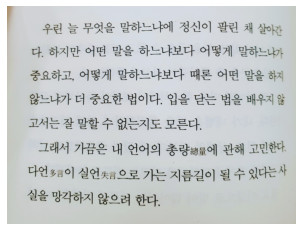

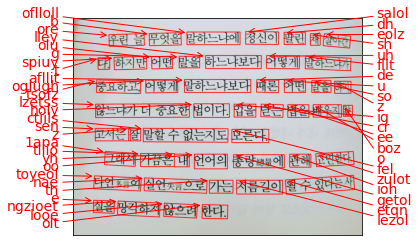

In [9]:
ocr(img_list[1])

---------------------------------
Google OCR API
Texts:

"세이
20000
RECE
200
Market NATURE
오!그래놀라 Dige
다이제
Diget
다이제
우유와
더든든하게
즐기세요!
Diage
250g(1,208 kcal)
그래놀라 93 %, 미니 이제 쿠키 5%,
다. 통밀 15%, 다이제 초콜릿 드리즐 11%, 식이섬유볼 0.9%
좋은것만드려요~
★★
오리온 추천
상품
오 그래놀라
Diget
우유와
더든든하게
즐기세요!
No lylglo
놀라
Rennggo
드
250kcal)
그래놀라 90% 미니 다이제 쿠키 5%
농원 15%, 대한 초콜릿 드리즐 11%, 식이섬유볼00%
다이지 그래놀라
7,500-3,990
국산화
70
은 것만 드려요~"

"세이"

"20000"

"RECE"

"200"

"Market"

"NATURE"

"오"

"!"

"그래"

"놀라"

"Dige"

"다"

"이제"

"Diget"

"다"

"이제"

"우유"

"와"

"더"

"든든하게"

"즐기"

"세요"

"!"

"Diage"

"250g"

"("

"1,208"

"kcal"

")"

"그래"

"놀라"

"93"

"%"

","

"미니"

"이제"

"쿠키"

"5"

"%"

","

"다"

"."

"통밀"

"15"

"%"

","

"다"

"이제"

"초콜릿"

"드리"

"즐"

"11"

"%"

","

"식이"

"섬유"

"볼"

"0.9"

"%"

"좋은"

"것만"

"드려요"

"~"

"★★"

"오리온"

"추천"

"상품"

"오"

"그래"

"놀라"

"Diget"

"우유"

"와"

"더"

"든든하게"

"즐기"

"세요"

"!"

"No"

"lylglo"

"놀라"

"Rennggo"

"드"

"250kcal"

")"

"그래"

"놀라"

"90"

"%"

"미니"

"다"

"이제"

"쿠키"

"5"

"%"

"농원"

"15"

"%"

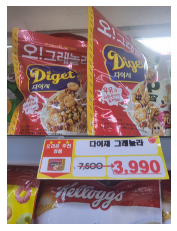

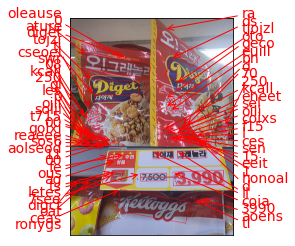

In [10]:
ocr(img_list[2])

---------------------------------
Google OCR API
Texts:

"3
11:00
last order 08:30
cafe
아이노팡야
하기
- 다구!
J
노
ONGYONTY
00
(3)
cenya 되겠
기
임피스는 1930년대 도쿄 긴자에서 탄생하여
계진 사랑 받는 일본의 전통 디저트입니다.
소화기
FIRE EXTINGUISHER"

"3"

"11:00"

"last"

"order"

"08:30"

"cafe"

"아이"

"노"

"팡야"

"하기"

"-"

"다구"

"!"

"J"

"노"

"ONGYONTY"

"00"

"("

"3"

")"

"cenya"

"되겠"

"기"

"임피"

"스는"

"1930"

"년대"

"도쿄"

"긴자"

"에서"

"탄생"

"하여"

"계진"

"사랑"

"받는"

"일본"

"의"

"전통"

"디저트"

"입니다"

"."

"소화기"

"FIRE"

"EXTINGUISHER"
bounds: (3408,186),(3512,48),(3524,57),(3420,195)
---------------------------------
keras_ocr
---------------------------------
Tesseract
/aiffel/aiffel/ocr_python/image/test3/0000.png
/aiffel/aiffel/ocr_python/image/test3/0001.png
/aiffel/aiffel/ocr_python/image/test3/0002.png
/aiffel/aiffel/ocr_python/image/test3/0003.png
/aiffel/aiffel/ocr_python/image/test3/0004.png
/aiffel/aiffel/ocr_python/image/test3/0005.png
/aiffel/aiffel/ocr_python/image/test3/0006.png
/aiffel/aiffel/ocr_python/image/test

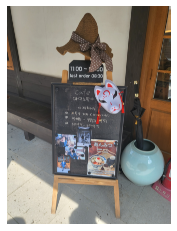

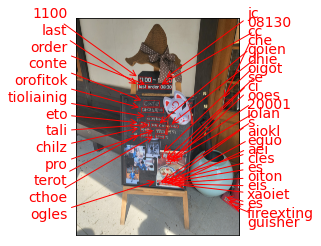

In [11]:
ocr(img_list[3])

---------------------------------
Google OCR API
Texts:

"양심
생선 썩은 냄새는 하루가 나고
고기 썩은 냄새는 이틀이 가고
양심 썩은 냄새는 평생을 간다.
||||||"

"양심"

"생선"

"썩은"

"냄새"

"는"

"하루"

"가"

"나고"

"고기"

"썩은"

"냄새"

"는"

"이틀"

"이"

"가고"

"양심"

"썩은"

"냄새"

"는"

"평생"

"을"

"간다"

"."

"||||||"
bounds: (298,459),(337,459),(337,469),(298,469)
---------------------------------
keras_ocr
---------------------------------
Tesseract
/aiffel/aiffel/ocr_python/image/test3/0000.png
/aiffel/aiffel/ocr_python/image/test3/0001.png
/aiffel/aiffel/ocr_python/image/test3/0002.png
/aiffel/aiffel/ocr_python/image/test3/0003.png
/aiffel/aiffel/ocr_python/image/test3/0004.png
/aiffel/aiffel/ocr_python/image/test3/0005.png
/aiffel/aiffel/ocr_python/image/test3/0006.png
/aiffel/aiffel/ocr_python/image/test3/0007.png
/aiffel/aiffel/ocr_python/image/test3/0008.png
/aiffel/aiffel/ocr_python/image/test3/0009.png
/aiffel/aiffel/ocr_python/image/test3/0010.png
/aiffel/aiffel/ocr_python/image/test3/0011.png
/aiffel/aiffel/ocr_python/image/test3/

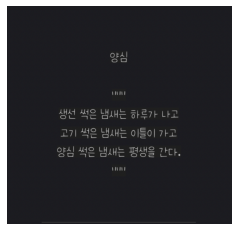

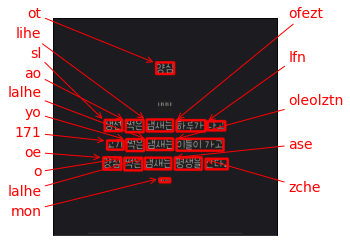

In [12]:
ocr(img_list[4])

---------------------------------
Google OCR API
Texts:

"SEVEN&
PREMIUM
ブリュレ風
バウムクーヘンアイス
たんぱく
質
264 3.2
Brulee style baumkuchen
食物
食塩
繊維 相当量
0.13
脂質 糖質
13.8 32.8 0.6
g
g
g
種類別 ラクトアイス 1個入
写真はイメージです"

"SEVEN"

"&"

"PREMIUM"

"ブリュレ"

"風"

"バウムクーヘン"

"アイス"

"たんぱく"

"質"

"264"

"3.2"

"Brulee"

"style"

"baumkuchen"

"食物"

"食"

"塩"

"繊維"

"相当"

"量"

"0.13"

"脂質"

"糖"

"質"

"13.8"

"32.8"

"0.6"

"g"

"g"

"g"

"種類"

"別"

"ラクトアイス"

"1"

"個"

"入"

"写真"

"は"

"イメージ"

"です"
bounds: (980,701),(1023,693),(1028,721),(985,729)
---------------------------------
keras_ocr
---------------------------------
Tesseract
/aiffel/aiffel/ocr_python/image/test3/0000.png
/aiffel/aiffel/ocr_python/image/test3/0001.png
/aiffel/aiffel/ocr_python/image/test3/0002.png
/aiffel/aiffel/ocr_python/image/test3/0003.png
/aiffel/aiffel/ocr_python/image/test3/0004.png
/aiffel/aiffel/ocr_python/image/test3/0005.png
/aiffel/aiffel/ocr_python/image/test3/0006.png
/aiffel/aiffel/ocr_python/image/test3/0007.png
/aiffel/aiffel/

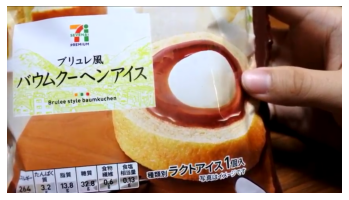

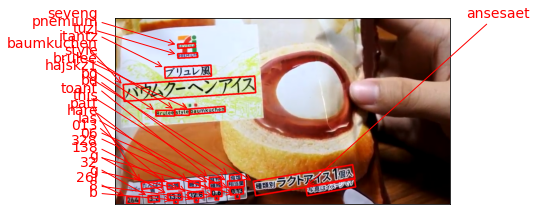

In [13]:
ocr(img_list[5])

---------------------------------
Google OCR API
Texts:

"너를 꽃길로 데려다줄 사람을 찾기보다
가시밭길을 함께 걸어줄 수 있는 사람이 되기를
사랑하게 해줘서 고마워"

"너를"

"꽃길"

"로"

"데려다"

"줄"

"사람"

"을"

"찾기"

"보다"

"가시밭"

"길"

"을"

"함께"

"걸어"

"줄"

"수"

"있는"

"사람"

"이"

"되기를"

"사랑"

"하게"

"해줘서"

"고마워"
bounds: (426,1874),(524,1874),(524,1909),(426,1909)
---------------------------------
keras_ocr
---------------------------------
Tesseract
/aiffel/aiffel/ocr_python/image/test3/0000.png
/aiffel/aiffel/ocr_python/image/test3/0001.png
/aiffel/aiffel/ocr_python/image/test3/0002.png
/aiffel/aiffel/ocr_python/image/test3/0003.png
/aiffel/aiffel/ocr_python/image/test3/0004.png
/aiffel/aiffel/ocr_python/image/test3/0005.png
/aiffel/aiffel/ocr_python/image/test3/0006.png
/aiffel/aiffel/ocr_python/image/test3/0007.png
/aiffel/aiffel/ocr_python/image/test3/0008.png
/aiffel/aiffel/ocr_python/image/test3/0009.png
/aiffel/aiffel/ocr_python/image/test3/0010.png
/aiffel/aiffel/ocr_python/image/test3/0011.png
/aiffel/aiffel/ocr_python/image/test

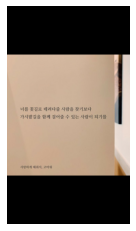

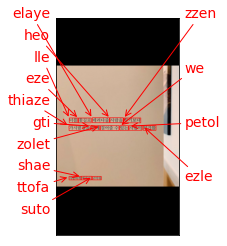

In [14]:
ocr(img_list[6])

---------------------------------
Google OCR API
Texts:

"+税
日本酒
月桂冠
山田錦
純米 (辛口)
480円+税
ノンアルコール
いくら
山田錦
サントリー
オールフリー
350円+税
ール類の販売をお断りさせていただきます。
BU TAR
大来たらこ
マヨ
とびこ
寿司皿
OD
※お寿司は全てわさび抜きで提供させていた
●贅沢!
●はま
●おろし
土･日・祝 100 円
平日 90 円
その他皿・容器
にぎり
大
サーモン
とろサーモン
焼とろサーモン
オニオンサーモン
スニオンズとろ~
炙りとろサーモン
サーモンカルパッチョ
サーモンアボカド
活〆ぷり
活〆ぶりとろ
ゆず塩炙りぶり
えんがわ
しめさば
炙りしめさば 牛カルビ
とろいわし
炙りとろいわし チーズハンバーグ
ローストビーフ
牛カルビマヨ
ハンバーグ
炙りえびチーズ
えび天
炙りえびマヨ
真いか
やりいか
ゆず塩やりいか
いか天
いか天ガーリックマヨ
大水だこ
真だこ
真だこカルパッチョ
100円
200⁹
あんきも
かにマヨ
かにみそ
たっぷりかにみそ
いかクラ
大津かにみそ
いかオクラ納豆
-
ローン
ツナサラ
シーフードサ
から揚げ軍艦
9
No. 注文品名
その場でもらえる!
オリジナル
クリアファイル
6種 数量限定
1 炙りうなぎ (2貫)
対象のドリンクLサイズ (420ml)を1杯ご注文
につきランダムで1枚プレゼント! (お一人様3枚まで)
第1弾期間:11/21 (木) ~12/1 (日) 3種
第2弾期間:12/2(月)~12/11 (水) 3種
注文状況
ひかりもの三種盛り
3
えび三種盛り(えび・甘えび生えび)
4 サーモン三種盛り
1
MY
HERO RIDE
僕のヒーロカリナコ
1/ 1
数量
1
1
1
キャンペーン実施中!!
オリジナル
アクリルキーホルダー
種 数量限定
MIRAGASHI
対象の商品を1つご注文に お持ち帰り
つき1個プレゼント!
限定
期間:12/12 (木)~12/29(日)
TVアニメ 毎週土曜夕方5:30放送中! 読売テレビ・日本テレビ系全国ネット 一部地域を除く 劇場版 12.20 [Frl.1 ROADSHOW
抽選で当たる!
オリジナルグッズ
2種各160名様
戻る
1,6

SystemError: tile cannot extend outside image

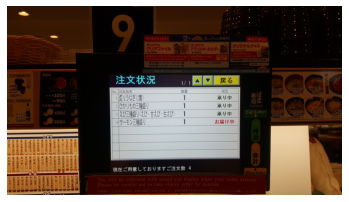

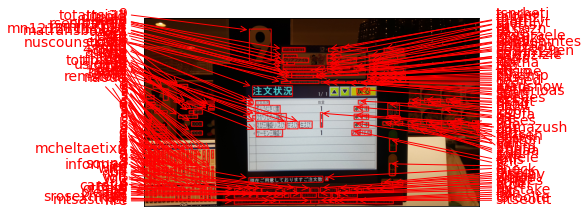

In [15]:
ocr(img_list[7])

---------------------------------
Google OCR API
Texts:

"① メニュー
○オリジナルブレンド
ハウスブレンド
深煎りブレンド
~苦味の強いブレンド~
アメリカンコーヒー
カフェ・オレ (ホットorアイス)
0 アイスコーヒー
アイス・ブレンド (水出し)
水出し特有の香りがあり、すっきりと飲みやすい
深煎り(単一豆)
モカシダモG-4
~苦味・コクが強く、香ばしい〜 産地 : エチオピア
グァテマラ・アンティグア・ピーベリー
~バランスが良く余韻を楽しめる~ 産地 : グァテマラ
モカマタリNo.9
芳醇な香味、苦味の中に甘味を感じさせる~ 産地 : イエメン
450
450
450
※コーヒーチケットございます。 (お気軽にお申し付け下さい)
500
500
450
500
600
中深煎り(単一豆)
コロンビアスプレモ
程よい酸味、バランスが良い~産地:コロンビア
メキシコ AL
上品な味と香り、優しい苦味~産地:メキシコ
サントスピーベリー
パプアニューギニア シグリAA
キレが良く、香味豊かで甘味もある 産地: パプアニューギニア
イルガチェフ・G-1 ナチュラル
酸味は少なく、華やかな香り~ 産地:エチオピア
スポット珈琲(単一豆)
随時変わります。 (お気軽にお聞き下さい)
珈琲以外
ココア(ホットorアイス)
ホットチョコレート
スイーツ
自家製ガトーショコラ(セットのみ)
450
450
500
600
500-700
500
600
250"

"①"

"メニュー"

"○"

"オリジナル"

"ブレンド"

"ハウス"

"ブレンド"

"深"

"煎り"

"ブレンド"

"~"

"苦味"

"の"

"強い"

"ブレンド"

"~"

"アメリカン"

"コーヒー"

"カフェ"

"・"

"オレ"

"("

"ホット"

"or"

"アイス"

")"

"0"

"アイス"

"コーヒー"

"アイス"

"・"

"ブレンド"

"("

"水"

"出し"

")"

"水"

"出し"

"特有"

"の"

"香り"

"が"

"あり"

"、"

"すっきり"

"と"

"飲み"

"やすい"

"深"

"煎り"

"("

"単一"

"豆"

")

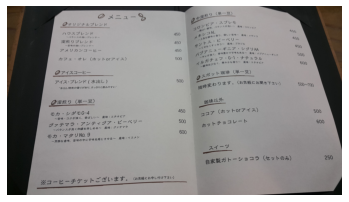

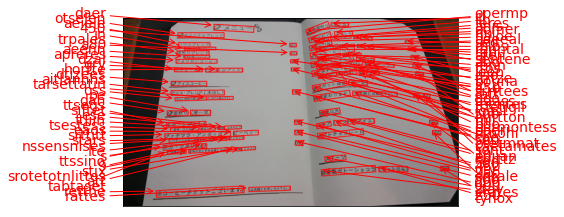

In [16]:
ocr(img_list[8])

---------------------------------
Google OCR API


/opt/conda/lib/python3.9/site-packages/pkg_resources/__init__.py:122: PkgResourcesDeprecationWarning: 0.996-ko-0.9.2 is an invalid version and will not be supported in a future release
  warnings.warn(


Texts:

"こくてつ
てくてつ
ONRENRE<
メンコ
UNR
こくて?
てくてう
UNR
EXT2
国から
JNR
JNR
てくてつ
UNR
幸福ゆき
てくてっ
UNR
こくてつ
ONR
UNR
発売当日から永久有効
ONK
220円
EN
途中下車禁止
ONR 幸福駅発行
UNR
こくてつ
UNR
UNR
UNR
てくて
UNR
てくてつ
UNR
€89)
UNR
IO
くてつ
UNR
UNR
さくら
大
$a
愛
CO
NO
S DA"

"こくてつ"

"てくてつ"

"ONRENRE"

"<"

"メンコ"

"UNR"

"こく"

"て"

"?"

"てく"

"て"

"う"

"UNR"

"EXT2"

"国"

"から"

"JNR"

"JNR"

"てくてつ"

"UNR"

"幸福"

"ゆき"

"てく"

"て"

"っ"

"UNR"

"こくてつ"

"ONR"

"UNR"

"発売"

"当日"

"から"

"永久"

"有効"

"ONK"

"220"

"円"

"EN"

"途中"

"下車"

"禁止"

"ONR"

"幸福"

"駅"

"発行"

"UNR"

"こくてつ"

"UNR"

"UNR"

"UNR"

"てく"

"て"

"UNR"

"てくてつ"

"UNR"

"€"

"89"

")"

"UNR"

"IO"

"くてつ"

"UNR"

"UNR"

"さくら"

"大"

"$"

"a"

"愛"

"CO"

"NO"

"S"

"DA"
bounds: (868,896),(927,896),(927,926),(868,926)
---------------------------------
keras_ocr
---------------------------------
Tesseract
/aiffel/aiffel/ocr_python/image/test3/0000.png


SystemError: tile cannot extend outside image

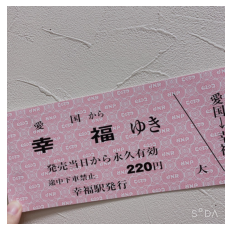

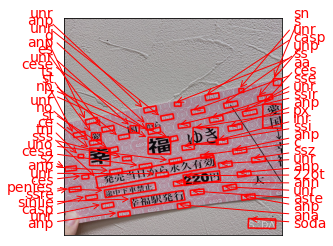

In [9]:
ocr(img_list[9])

---------------------------------
Google OCR API


/opt/conda/lib/python3.9/site-packages/pkg_resources/__init__.py:122: PkgResourcesDeprecationWarning: 0.996-ko-0.9.2 is an invalid version and will not be supported in a future release
  warnings.warn(


Texts:

"こくてつ
てくてつ
ONRENRE<
メンコ
UNR
こくて?
てくてう
UNR
EXT2
国から
JNR
JNR
てくてつ
UNR
幸福ゆき
てくてっ
UNR
こくてつ
ONR
UNR
発売当日から永久有効
ONK
220円
EN
途中下車禁止
ONR 幸福駅発行
UNR
こくてつ
UNR
UNR
UNR
てくて
UNR
てくてつ
UNR
€89)
UNR
IO
くてつ
UNR
UNR
さくら
大
$a
愛
CO
NO
S DA"

"こくてつ"

"てくてつ"

"ONRENRE"

"<"

"メンコ"

"UNR"

"こく"

"て"

"?"

"てく"

"て"

"う"

"UNR"

"EXT2"

"国"

"から"

"JNR"

"JNR"

"てくてつ"

"UNR"

"幸福"

"ゆき"

"てく"

"て"

"っ"

"UNR"

"こくてつ"

"ONR"

"UNR"

"発売"

"当日"

"から"

"永久"

"有効"

"ONK"

"220"

"円"

"EN"

"途中"

"下車"

"禁止"

"ONR"

"幸福"

"駅"

"発行"

"UNR"

"こくてつ"

"UNR"

"UNR"

"UNR"

"てく"

"て"

"UNR"

"てくてつ"

"UNR"

"€"

"89"

")"

"UNR"

"IO"

"くてつ"

"UNR"

"UNR"

"さくら"

"大"

"$"

"a"

"愛"

"CO"

"NO"

"S"

"DA"
bounds: (868,896),(927,896),(927,926),(868,926)
---------------------------------
keras_ocr
---------------------------------
Tesseract
/aiffel/aiffel/ocr_python/image/test3/0000.png


SystemError: tile cannot extend outside image

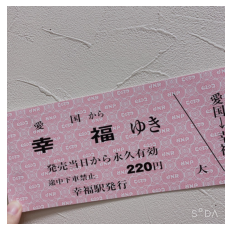

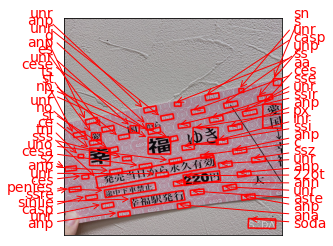

In [5]:
ocr(img_list[9])

# 회고
만화, 영어, 일본어, 한국어, 메뉴판, 티켓, 인터넷상 텍스트, 책 등등을 10장의 이미지 테스트 해보았습니다.  

1. 전체적으로 Google OCR이 3개국어 인식을 잘 하더라구요.
2. keras_ocr의 언어가 eng이기에 이미지 내의 모든 글자들을 english로 유추해서 나타납니다.  
3. 언어 설정을 kor로 설정했던 tesseract는 찾아야할 것들이 많다면 초과했다고 에러가 나옵니다.  

더 나아가 다른 예시로 1개만 비교를 해본다면   
결론은 google ocr이 한국어의 형태소 분석을 잘한다고 눈에 띄게 보여주네요. 
tesseract는 한국어 설정을 해도 눈에 띄게 형태소를 잘 구분 못해주었습니다.  
__Google OCR__
> "양심
> 생선 썩은 냄새는 하루가 나고  
> 고기 썩은 냄새는 이틀이 가고  
> 양심 썩은 냄새는 평생을 간다.  

    "양심", "생선", "썩은", "냄새", "는", "하루", "가", "나고", "고기", "썩은", "냄새" , "는"  
    "이틀", "이", "가고", "양심", "썩은", "냄새", "는", "평생", "을", "간다", "."

__tesseract__  
    생선
이스오로2는하드'/-배게빌킴1고0 |1뻐이들이10 랍이부슨저로로전!톡수사다Done
 
 

### 결론    
1. 잘 모를 때에는 Google OCR 사용
> api 연동 시키고 카드 등록하는 부분이 까다롭다.는 단점  
> 우선, 영어 일본어 한국어에 능통하고 흐릿, 가려짐 등등 다양한 이미지에도 능통하다.  

2. 언어가 영어이면서 이미지로 확인 하고 싶을 때는 keras_ocr
> 이미지에 문자가 있을 영역에 BBox를 만들고 인식하는 과정이 다소 시간이 오래 걸린다.  
> 그리고 커널이 죽는 현상이 일어나서 한 번에 많은 이미지를 확인 못한다.  

3. tesseract 한국어는 추천 못함.
> 영어라면 달랐을 지도?  
> 이미지를 crop하는 과정을 거치는데 너무 많은 crop하면 에러가 뜬다. 하...  
> 추천 못함..

P.S
$$"너를 꽃길로 데려다줄 사람을 찾기보다  $$
$$ 가시밭길을 함께 걸어줄 수 있는 사람이 되기를$$ 
$$ 사랑하게 해줘서 고마워"$$ 
$$-김재식$$